<H1 style="text-align: center">COMM417DA - Machine Learning (Professional)</H1>
<H2 style="text-align: center">Coursework</H2>

## Overview

The aim of this coursework is to write and test code for 1) A housing price prediction problem; 2) A classification problem with various classifiers; 3) An autoencoder and 4) A maskedface detector.

Through this coursework,

1. You would be familiarise yourself with regression problems, the k-nearest neighbours, support vector machine, multi layer perceptron classifiers, CNNs and their applications.

2. You will also decide different parameters or hyperparameters based on k-fold cross validation strategy.

3. You will implement different regularisers.

4. You will train and evaluate models on real-world datasets.

Your IPython notebook should show what you did, what is the result, and what you can conclude from the exercise. For the report, you will need to consider the following criteria:

* **Explain Actions:** What and why have you done something?
* **Task Record:** Does it record what was done in the exercise?
* **Parameter Behaviour:** Analyze and explain how certain parameters affect your models.
* **Reproducibility:** Are the results reproducible or replicated by others?
* **Theory-Practice Link:** How does the work relate to the theoretical foundations discussed in lectures?
* **Presentation and visualization:** Is it well presented?
* **References:** References of papers, links etc. if appropriate.

## Submission

- Code (this notebook after completion) **[25 + 30 + 15 + 30 = 100 marks]**
- Report **[100 marks]**. Please submit a standalonw `.pdf` file. The report will be marked along with the code, as most of the analysis is based on the code and results.
- Your final score: **the score for code** * 80% + **the score for report** * 20%.

     For example, someone gets `90` for the code, and `80` for the report. The final score is `90 * 80% + 80 * 20% = 88`
     

Note that an electronic submission is required which will be available on the ELE page. You should submit the files in a zip format electronically. If you're not sure where the notebook in your homespace it is, type <code>pwd</code> (print working directory) in a cell to find out where the notebooks are.



The coursework is an **individual** exercise.  The reports you write should be about the results **you** obtained, and your attention is drawn to the College and University guidelines on collaboration and plagiarism.

In [2]:
!pip install matplotlib
!pip install seaborn

Looking in indexes: https://artifacts.jpmchase.net/artifactory/api/pypi/pypi/simple/
Looking in indexes: https://artifacts.jpmchase.net/artifactory/api/pypi/pypi/simple/
     |████████████████████████████████| 294 kB 2.1 MB/s eta 0:00:01


In [3]:
# Pandas and NumPy are popular libraries in Python for data manipulation and analysis. They are both open-source tools and often used together.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Part 1: Regression (25 marks)

We all have experienced a time when we have to look up for a new house to buy. But then the journey begins with a lot of frauds, negotiating deals, researching the local areas and so on. In this first part of the coursework, your task is to develop Machine Learning models to predict median house values in Californian districts, given a number of features from these districts.

We will use **The California Housing dataset** that is a widely used resource in machine learning. Drawn from the 1990 U.S. Census data, it consists of information gathered from all the block groups in California. A block group is the smallest geographical unit for which the U.S. Census Bureau publishes sample data (a block group typically has a population of 600 to 3,000 people). The target variable is the **median** house value for California districts, expressed in hundreds of thousands of dollars ($100,000). It offers a detailed look at housing conditions in California during that time.

| Data Set Characteristics | Details |
|--------------------------|---------|
| Number of Instances     | 20640   |
| Number of Attributes    | 8 numeric predictive attributes and the target value; if downloaded from ELE, it has 1 additional categorical attribute  |
| Attribute Information   | median_income: Median income in block group |
|                          | housing_median_age: Median house age in block group |
|                          | total_rooms: Total number of rooms in block group |
|                          | total_bedrooms: Total number of bedrooms in block group |
|                          | population: Block group population |
|                          | households: Total number of household members |
|                          | latitude: Block group latitude |
|                          | longitude: Block group longitude |
|                          | ocean_proximity: Location of the house w.r.t ocean/sea |
| Missing Attribute Values| None    |

The following code snippet will download the data, but if you have problem downloading the data using the code, you can also download it from course ELE page.

**note**: If you download the data from ELE, please unzip the `housing.tgz` into a local folder 'datasets/housing.csv', to use the given function `load_housing_data`.

In [43]:
# # If you downloaded the data from ELE, use the following code
# # load the data through a CSV file.
import tarfile
import urllib.request
from pathlib import Path


def load_housing_data():
    tarball_path = Path("datasets/housing.csv")
    if not tarball_path.is_file():
            Path("datasets").mkdir(parents=True, exist_ok=True)
    return pd.read_csv(Path("datasets/housing.csv"))

housing = load_housing_data()  # Note that the datasets loaded from sklearn and CSV have different names for the features, e.g, total vs average values.
print(housing.keys())

# This dataset is also available in the sklearn library. But there's a difference in the feature names; it also removes the categorical feature ocean_proximity.
# download the data via sklearn
# from sklearn.datasets import fetch_california_housing
# housing = fetch_california_housing(as_frame=True)
# print(housing.keys())

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')


In [5]:
#Pandas offers a nice representation and has functions for filtering, cleaning, and structuring data.
print(housing.head())
print("Housing Dataframe Information:-")
print(housing.info())
print("Housing Dataframe Describe:-")
print(housing.describe())
#also try shape; info(); describe()

   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -122.23     37.88                41.0        880.0           129.0   
1    -122.22     37.86                21.0       7099.0          1106.0   
2    -122.24     37.85                52.0       1467.0           190.0   
3    -122.25     37.85                52.0       1274.0           235.0   
4    -122.25     37.85                52.0       1627.0           280.0   

   population  households  median_income  median_house_value ocean_proximity  
0       322.0       126.0         8.3252            452600.0        NEAR BAY  
1      2401.0      1138.0         8.3014            358500.0        NEAR BAY  
2       496.0       177.0         7.2574            352100.0        NEAR BAY  
3       558.0       219.0         5.6431            341300.0        NEAR BAY  
4       565.0       259.0         3.8462            342200.0        NEAR BAY  
Housing Dataframe Information:-
<class 'pandas.core.frame.DataFrame'>
Range

*Please be aware that the feature names vary between datasets loaded from sklearn and those loaded from CSV files.* When working with these datasets, ensure to correctly identify and map the corresponding features before proceeding with your data analysis or model training.

In [6]:
# This only works with the dataset downloaded from the ELE
import plotly.express as px
housing = load_housing_data()
housing.head()

fig = px.scatter_mapbox(housing,lat='latitude',lon='longitude',color='median_house_value',hover_name='ocean_proximity',
                        size='population',mapbox_style="stamen-terrain",zoom=5,size_max=25)
fig.show()

The `ocean_proximity` feature is only included in CSV file. It is a categorical attibute that needs to be handled appropriately.


>**For Part 1**, the task is

>. **40 marks:** Please load the data from the CSV file and handle the `ocean_proximity` feature in the follwoing tasks. This will involve converting this categorical data into a suitable format for machine learning algorithms, which typically require numerical input.

## 1.1 Data preprocessing [5 marks]
After loading the data, it’s a good practice to check if there are any missing values in the data. We count the number of missing values for each feature using `isnull()`. Ideally, this particular dataset should not contain any missing values.

In [7]:
# Counting all NaNs.
housing.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [8]:
# Percentage of nulls
housing.isnull().mean()*100

longitude             0.000000
latitude              0.000000
housing_median_age    0.000000
total_rooms           0.000000
total_bedrooms        1.002907
population            0.000000
households            0.000000
median_income         0.000000
median_house_value    0.000000
ocean_proximity       0.000000
dtype: float64

In [9]:
# Counting all NaNs.
housing.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [10]:
# Check the NaNs in total_bedrooms column.
housing['total_bedrooms'].isna().sum()

207

<Axes: >

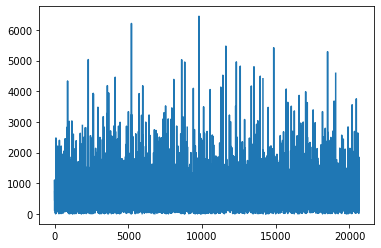

In [11]:
housing['total_bedrooms'].plot()

In [12]:
# Check the NaNs in ocean_proximity column.
housing['ocean_proximity'].isna().sum()

0

Handling missing data is an important step in preparing the dataset for a machine learning model. Here are some common strategies for dealing with missing data:

1. **Remove Rows or Columns with Missing Data:** This is the simplest approach and involves removing observations (rows) or variables (columns) that have missing values. However, you could lose valuable data with this approach, especially if you're not missing data completely at random.

2. **Imputation:** Imputation is a method of filling in the missing value with some value. There are different ways to do this:

    - **Mean/Median/Mode Imputation:** You can fill in the missing values with the mean (for numerical data) or median (when the numerical data is not normally distributed) or mode (for categorical data). This is easy to do but doesn't factor in the correlations between features.
   
    - **Predictive Imputation:** In this method, we use statistical models or machine learning algorithms to predict the missing values based on other observed data.

In this task, we will handle the missing data through predicive imputaiton.

 **a. Random deletion:** Randomly delete some data from one or more feature columns to **simulate** missing data.

 **b. Imputation:** Choose a predictive imputation method (e.g., KNN imputation, Random Forest or MICE) to handle the mssing data.

 **c. Evaluation:**  Compare the imputed values with the actual values that were removed in step 1. Discuss the results and the effectiveness of the chosen imputation method.

 Note that there are missing values in the `total_bedrooms` feature already. Besides, we also impute missing values for the `ocean_proximity` feature.



In [13]:
# Your code here
housing.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY


In [14]:
# 1. Remove Rows or Columns with Missing Data.
housing_drop_missing = housing[housing['total_bedrooms'].notna()]
# print the count of NaNs after dropping.
print(housing_drop_missing.isna().sum())

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64


In [15]:
# Imputation of missing rows using mean strategy.
from sklearn.impute import SimpleImputer
mean_imputer = SimpleImputer(strategy='mean')
housing_imputed_mean = housing.copy()
housing_imputed_mean['total_bedrooms'] = mean_imputer.fit_transform(housing['total_bedrooms'].values.reshape(-1,1))

In [16]:
housing_imputed_mean.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [17]:
# Imputation of missing rows using mean strategy.
from sklearn.impute import SimpleImputer
mean_imputer = SimpleImputer(strategy='median')
housing_imputed_median = housing.copy()
housing_imputed_median['total_bedrooms'] = mean_imputer.fit_transform(housing['total_bedrooms'].values.reshape(-1,1))

In [18]:
housing_imputed_median.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [19]:
# Imputation of missing rows using mean strategy.
from sklearn.impute import SimpleImputer
mean_imputer = SimpleImputer(strategy='most_frequent')
housing_imputed_mode = housing.copy()
housing_imputed_mode['total_bedrooms'] = mean_imputer.fit_transform(housing['total_bedrooms'].values.reshape(-1,1))

In [20]:
housing_imputed_mode.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [21]:
from sklearn.impute import KNNImputer
knn_imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')
housing_imputed_knn = housing.copy()
housing_imputed_knn['total_bedrooms'] = knn_imputer.fit_transform(housing['total_bedrooms'].values.reshape(-1,1))

In [22]:
housing_imputed_knn['total_bedrooms'].describe()

count    20640.000000
mean       537.870553
std        419.266592
min          1.000000
25%        297.000000
50%        438.000000
75%        643.250000
max       6445.000000
Name: total_bedrooms, dtype: float64

In [23]:
housing_imputed_knn.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

<Axes: >

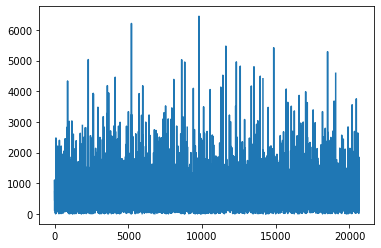

In [24]:
housing['total_bedrooms'].plot()

<Axes: >

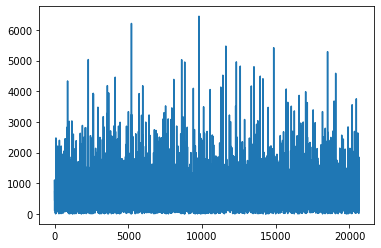

In [25]:
housing_imputed_knn['total_bedrooms'].plot()

<Axes: >

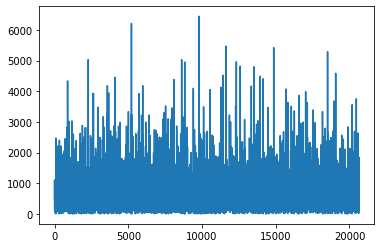

In [26]:
housing_imputed_median['total_bedrooms'].plot()

In [27]:
# 2. Imputation 

# Mean Imputation
mean_imputation = housing.mean()
print(mean_imputation.head())
mean_housing_imputed_df = housing.fillna(mean_imputation)

print(mean_housing_imputed_df.head())

longitude             -119.569704
latitude                35.631861
housing_median_age      28.639486
total_rooms           2635.763081
total_bedrooms         537.870553
dtype: float64
   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -122.23     37.88                41.0        880.0           129.0   
1    -122.22     37.86                21.0       7099.0          1106.0   
2    -122.24     37.85                52.0       1467.0           190.0   
3    -122.25     37.85                52.0       1274.0           235.0   
4    -122.25     37.85                52.0       1627.0           280.0   

   population  households  median_income  median_house_value ocean_proximity  
0       322.0       126.0         8.3252            452600.0        NEAR BAY  
1      2401.0      1138.0         8.3014            358500.0        NEAR BAY  
2       496.0       177.0         7.2574            352100.0        NEAR BAY  
3       558.0       219.0         5.6431        

/tmp/ipykernel_40760/2288052305.py:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



<Axes: >

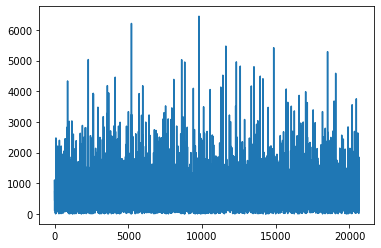

In [28]:
mean_housing_imputed_df['total_bedrooms'].plot()

## 1.2 Exploratory Data Analysis [5 marks]
Exploratory Data Analysis is a very important step before training the model. In this section, we will use some visualizations to discover and gain insights of the relationship of the target variable with other features. To begin this exploratory analysis, we may need `matplotlib`, `seaborn`, or `plotly` (we don't need to use all of them).

In [29]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

Implement the following functions detailed below, and conclude your observations and analysis.

**a.** Display each feature in a histogram graph

**b.** Plot the distribution of the target variable `median_house_value`

**c.** Create a correlation matrix that measures the linear relationships between the variables. The correlation coefficient operates on a scale from -1 to 1. If the coefficient is close to 1, it indicates a strong positive correlation between the two variables (meaning as one variable increases, the other tends to increase as well). Conversely, a coefficient near -1 indicates a strong negative correlation, suggesting that an increase in one variable is typically associated with a decrease in the other. This understanding of correlations can be instrumental in determining relationships between variables in your data.

**d.** An important point in selecting features for a regression model is to check for multi-co-linearity. We should not select the features pairs that are strongly correlated to each other for training the model. Please analyse the related features derived from the correlation matrix and analyse the features that exhibits a high correlation with the target variable. Illustrate these relationships visually through the use of figures.

**e.** Plot the distribution of the `ocean_proximity` feature (unique categories and counts) and demonstrate how you handle this categorical variable in your dataset.


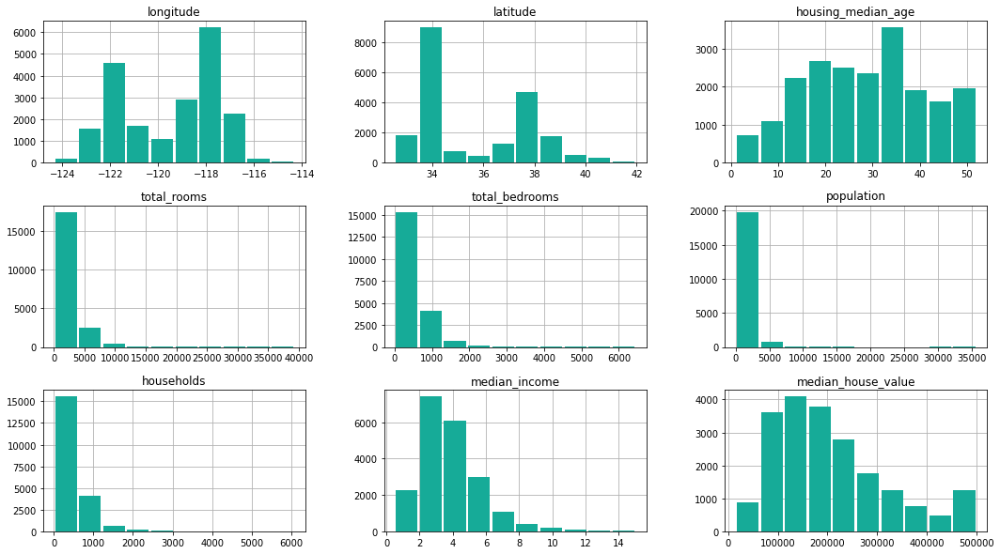

In [30]:
# a. Display each feature in a histogram graph.
housing.hist(figsize=(18,10), color='#16ab98', zorder=2, rwidth=0.9)
plt.show()

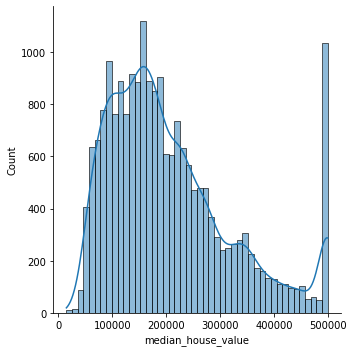

In [31]:
# b. plot the distribution of the target variable median_house_value
sns.displot(housing, x="median_house_value", kde=True)

In [44]:
# c. Correlation matrix.
print(housing.corr())
housing_corr = housing.corr()
housing_corr.style.background_gradient(cmap='coolwarm')

                    longitude  latitude  housing_median_age  total_rooms  \
longitude            1.000000 -0.924664           -0.108197     0.044568   
latitude            -0.924664  1.000000            0.011173    -0.036100   
housing_median_age  -0.108197  0.011173            1.000000    -0.361262   
total_rooms          0.044568 -0.036100           -0.361262     1.000000   
total_bedrooms       0.069608 -0.066983           -0.320451     0.930380   
population           0.099773 -0.108785           -0.296244     0.857126   
households           0.055310 -0.071035           -0.302916     0.918484   
median_income       -0.015176 -0.079809           -0.119034     0.198050   
median_house_value  -0.045967 -0.144160            0.105623     0.134153   

                    total_bedrooms  population  households  median_income  \
longitude                 0.069608    0.099773    0.055310      -0.015176   
latitude                 -0.066983   -0.108785   -0.071035      -0.079809   
housing_

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


In [33]:
housing['ocean_proximity'].nunique()

5

In [34]:
housing['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

<Axes: >

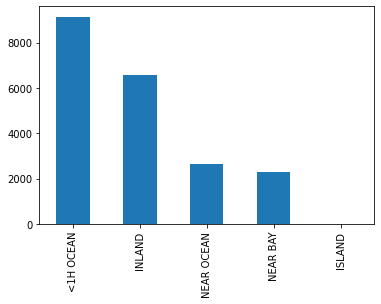

In [35]:
housing['ocean_proximity'].value_counts().plot(kind='bar')

In [36]:
# Label encoding for the ocean-proximity column.
# But it provides the relative ranking of the ocean_proximity.
# from sklearn.preprocessing import LabelEncoder

def label_encoder(a):
    le = LabelEncoder()
    housing_imputed_knn[a] = le.fit_transform(housing_imputed_knn[a])

# label_list = ['ocean_proximity']
#for i in label_list:
#    label_encoder(i)

In [37]:
ocean_proxy_cols = pd.get_dummies(housing_imputed_knn.ocean_proximity)
housing_transformed_df = pd.concat([housing_imputed_knn, ocean_proxy_cols], axis=1)

In [38]:
housing_transformed_df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', '<1H OCEAN', 'INLAND',
       'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
      dtype='object')

In [39]:
housing_transformed_df.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,0,0,0,1,0
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY,0,0,0,1,0
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY,0,0,0,1,0
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY,0,0,0,1,0
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY,0,0,0,1,0
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY,0,0,0,1,0


## 1.3 Training the model for housing price prediction [15 marks]

a. **Data Partitioning: Training and Testing Sets**

As our next step, we split the data into two subsets: a training set and a testing set. We train the model with 80% of the samples and test with the remaining 20%. We do this to assess the model’s performance on unseen data. Please print the sizes of the training and test sets to verify if the splitting has occurred properly.

<b>NB:</b> We must <b>not</b> use the test data as part of the training process.

b. **Training and testing the models**

We will use three different algorithms in this task: Linear Regression, Multilayer Perceptron (MLP) and the Support Vector Machine (SVM).

- Experiment with different values of the regularization constant in each model, observing how they affect the regression models' performance. Through plotting, we can observe and interpret the impact of regularization on the regression models' fit.
  
- Explore the relationship between the number of training examples and the performance of the regression models. Investigate how the models' accuracy and predictive power change as the size of the training dataset increases. While keeping the test set size constant, conduct multiple runs where the training set is sampled from the available data points. Some data points may become redundant across different runs, which is acceptable. By analyzing the model's performance across different training set sizes, we can gain insights into how the models generalize with varying amounts of training data and understand the impact of dataset size on their predictive capabilities.
  
- Utilize cross-validation to determine the optimal hyperparameter values for the regression models. By dividing the training data into folds and evaluating performance on different combinations of these folds, we can select the hyperparameter values that yield the best results. We will then assess how well the validation error obtained through cross-validation corresponds to the actual test error, providing insights into the models' generalization performance.

- Explore the performance of the regression models using different subsets of features. Start by defining multiple feature sets by selecting subsets of the available features in the dataset. For example, you can create feature sets based on different categories, correlations, or groups of related features. This means training the models multiple times, each time using a different feature set. Compare the performance of the models across the different feature sets, analyze the impact of different feature subsets on their predictive accuracy, and report your findings.
  
c. **Evaluate the models and conclude your methods and results.**
- Use multiple evaluation metrics to assess model performance, such as mean squared error (MSE), root mean squared error (RMSE), mean absolute error (MAE), and R-squared (R2) score.
- Compare the performance of different models.

In [125]:
# Your code here
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from math import sqrt
from sklearn.model_selection import cross_val_score

# total_rooms, total_bedrooms, populated and households  are highly correlated.
# Selected features which are not correlated.
X = housing_transformed_df[['longitude','latitude','housing_median_age','total_rooms','total_bedrooms','population','households',
                            'median_income','<1H OCEAN', 'INLAND','ISLAND', 'NEAR BAY', 'NEAR OCEAN']]
#X_sel1 = housing_imputed_knn[['longitude','latitude','housing_median_age','total_rooms','median_income','ocean_proximity']]
#X_sel = housing_imputed_knn[['housing_median_age','households','median_income','ocean_proximity']]
# Total rooms, total_bedrooms, population and households are all corelated significantly.
# We can reduce the number of features to try the model.

# X = housing_imputed_knn[['longitude','latitude','housing_median_age','population','households','median_income']]
# Target Variable of median_house_value
y = housing_transformed_df['median_house_value']

# Divide the dataset into training and testing in 80% and 20%.
#X_train, X_test, y_train, y_test = train_test_split(X_sel, y, random_state=11, test_size=0.20, shuffle=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=11, test_size=0.20, shuffle=True)

print("X_train shape :-")
print(X_train.shape)
print("X_test shape :-")
print(X_test.shape)
print("y_train shape :-")
print(y_train.shape)
print("y_test shape :-")
print(y_test.shape)
print(type(y_test))
actual_values = y_test.to_numpy()
print(type(actual_values))
print("Actual Values:-")
print(actual_values[1:10])

linear_reg_model = LinearRegression()
linear_reg_model.fit(X_train, y_train)

print("Training score of the linear regression model:-")
print(linear_reg_model.score(X_train, y_train))

print("R2 Score of the model:-")
print(linear_reg_model.score(X_test,y_test))

#Predicted values.
predicted_housing_prices = linear_reg_model.predict(X_test)

print(type(predicted_housing_prices))
print(predicted_housing_prices.shape)
print(predicted_housing_prices[1:10])

MAE_error = mean_absolute_error(actual_values, predicted_housing_prices)
MSE_error = mean_squared_error(actual_values, predicted_housing_prices)
RMSE_error = sqrt(MSE_error)

print("MAE Error:-")
print(MAE_error)
print("MSE Error:-")
print(MSE_error)
print("RMSE Error:-")
print(RMSE_error)

linear_reg_r2_score = r2_score(actual_values,predicted_housing_prices)
print("R2 Scores:-")
print(linear_reg_r2_score)

k_cross_val = 15
cross_val_list=[]
for i in range(1, k_cross_val):
    
    print("K Cross Validation for :- {}".format(i+1))
    cv_scores = cross_val_score(linear_reg_model, X, y, cv=5)
    print(cv_scores)
    print("cv_scores mean:{}".format(np.mean(cv_scores)))
    cross_val_list.append(np.mean(cv_scores))
# Find the best value of k for KNN in this task
print(np.max(cross_val_list))

X_train shape :-
(16512, 13)
X_test shape :-
(4128, 13)
y_train shape :-
(16512,)
y_test shape :-
(4128,)
<class 'pandas.core.series.Series'>
<class 'numpy.ndarray'>
Actual Values:-
[392800.  98000. 218300. 212800. 123800. 240700. 309100.  94400. 139700.]
Training score of the linear regression model:-
0.6411354484270064
R2 Score of the model:-
0.6616605764188663
<class 'numpy.ndarray'>
(4128,)
[307450.9  187478.92 292845.93 252123.93  67648.17 208264.29 269501.4
  73063.47 110660.35]
MAE Error:-
49163.32811167741
MSE Error:-
4544350467.671473
RMSE Error:-
67411.79768906532
R2 Scores:-
0.6616605764188663
K Cross Validation for :- 2
[0.62 0.64 0.65 0.65 0.66]
cv_scores mean:0.6442754276748642
K Cross Validation for :- 3
[0.62 0.64 0.65 0.65 0.66]
cv_scores mean:0.6442754276748642
K Cross Validation for :- 4
[0.62 0.64 0.65 0.65 0.66]
cv_scores mean:0.6442754276748642
K Cross Validation for :- 5
[0.62 0.64 0.65 0.65 0.66]
cv_scores mean:0.6442754276748642
K Cross Validation for :- 6
[0.6

In [126]:
# Polynomial and standard scaler regularization.
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', LinearRegression())
]

pipeline1 = Pipeline(steps)

pipeline1.fit(X_train, y_train)

print('Training score: {}'.format(pipeline1.score(X_train, y_train)))
print('Test score: {}'.format(pipeline1.score(X_test, y_test)))

#Predicted values.
predicted_housing_prices = pipeline1.predict(X_test)

print(type(predicted_housing_prices))
print(predicted_housing_prices.shape)
print(predicted_housing_prices[1:10])

MAE_error = mean_absolute_error(actual_values, predicted_housing_prices)
MSE_error = mean_squared_error(actual_values, predicted_housing_prices)
RMSE_error = sqrt(MSE_error)

print("MAE Error:-")
print(MAE_error)
print("MSE Error:-")
print(MSE_error)
print("RMSE Error:-")
print(RMSE_error)

linear_reg_r2_score = r2_score(actual_values,predicted_housing_prices)
print("R2 Scores:-")
print(linear_reg_r2_score)

Training score: 0.708547898502105
Test score: 0.7210561062328109
<class 'numpy.ndarray'>
(4128,)
[339796.72 177983.59 300086.18 273031.12  94143.09 209037.99 295829.06
  85634.35 119075.53]
MAE Error:-
43661.9532970458
MSE Error:-
3746589152.0355244
RMSE Error:-
61209.387777003
R2 Scores:-
0.7210561062328109


In [200]:
# Ridge and StandardScalar regularization.
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Ridge(alpha=5, fit_intercept=True))
]

ridge_pipe = Pipeline(steps)
ridge_pipe.fit(X_train, y_train)

print('Training Score: {}'.format(ridge_pipe.score(X_train, y_train)))
print('Test Score: {}'.format(ridge_pipe.score(X_test, y_test)))


print('Training score: {}'.format(pipeline1.score(X_train, y_train)))
print('Test score: {}'.format(pipeline1.score(X_test, y_test)))

#Predicted values.
predicted_housing_prices = ridge_pipe.predict(X_test)

print(type(predicted_housing_prices))
print(predicted_housing_prices.shape)
print(predicted_housing_prices[1:10])

MAE_error = mean_absolute_error(actual_values, predicted_housing_prices)
MSE_error = mean_squared_error(actual_values, predicted_housing_prices)
RMSE_error = sqrt(MSE_error)

print("MAE Error:-")
print(MAE_error)
print("MSE Error:-")
print(MSE_error)
print("RMSE Error:-")
print(RMSE_error)

linear_reg_r2_score = r2_score(actual_values,predicted_housing_prices)
print("R2 Scores:-")
print(linear_reg_r2_score)

Training Score: 0.7082877084900416
Test Score: 0.7215334447928852
Training score: 0.708547898502105
Test score: 0.7210561062328109
<class 'numpy.ndarray'>
(4128,)
[339398.01 178126.37 299827.41 268610.    91948.31 208549.71 294573.75
  85564.9  120100.12]
MAE Error:-
43682.75517789345
MSE Error:-
3740177857.4670362
RMSE Error:-
61156.993528680236
R2 Scores:-
0.7215334447928852


In [201]:
# L1 Regularization or Lasso Regularization

steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Lasso(alpha=0.3, fit_intercept=True))
]

lasso_pipe = Pipeline(steps)

lasso_pipe.fit(X_train, y_train)

print('Training score: {}'.format(lasso_pipe.score(X_train, y_train)))
print('Test score: {}'.format(lasso_pipe.score(X_test, y_test)))

#Predicted values.
predicted_housing_prices = lasso_pipe.predict(X_test)

print(type(predicted_housing_prices))
print(predicted_housing_prices.shape)
print(predicted_housing_prices[1:10])

MAE_error = mean_absolute_error(actual_values, predicted_housing_prices)
MSE_error = mean_squared_error(actual_values, predicted_housing_prices)
RMSE_error = sqrt(MSE_error)

print("MAE Error:-")
print(MAE_error)
print("MSE Error:-")
print(MSE_error)
print("RMSE Error:-")
print(RMSE_error)

linear_reg_r2_score = r2_score(actual_values,predicted_housing_prices)
print("R2 Scores:-")
print(linear_reg_r2_score)

Training score: 0.7082029016529783
Test score: 0.7222852272913425
<class 'numpy.ndarray'>
(4128,)
[339844.1  178741.51 300154.4  269108.11  90570.93 207326.61 295621.75
  85795.03 119780.68]
MAE Error:-
43661.87383626946
MSE Error:-
3730080414.1590953
RMSE Error:-
61074.384271633025
R2 Scores:-
0.7222852272913425


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.187e+13, tolerance: 2.194e+10



In [202]:
%%time
# MLP network
from sklearn.neural_network import MLPRegressor

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Trying the MLPRegressor with 20,000 iterations.
mlp_model = MLPRegressor(hidden_layer_sizes=(100,), solver='lbfgs', activation='relu', max_iter=10000)

mlp_model.fit(X_train, y_train)
 
# Make predictions on the test data
y_pred = mlp_model.predict(X_test)
 
MAE_error1 = mean_absolute_error(actual_values, y_pred)
MSE_error1 = mean_squared_error(actual_values, y_pred)
RMSE_error1 = sqrt(MSE_error1)
print("MAE Error:-")
print(MAE_error1)
print("MSE Error:-")
print(MSE_error1)
print("RMSE Error:-")
print(RMSE_error1)
linear_reg_r2_score = r2_score(actual_values,y_pred)

print("R2 Scores:-")
print(linear_reg_r2_score)
      
# Selected feature set scores:-
#39159.761000326005
#3252688833.508732
#57032.34900921346
#R2 Scores:-
#0.765361784988279

MAE Error:-
35795.726256426846
MSE Error:-
2770463667.474768
RMSE Error:-
52635.19419052967
R2 Scores:-
0.7937313402709038
CPU times: user 1h 5min 47s, sys: 3h 32min 6s, total: 4h 37min 53s
Wall time: 11min 48s


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



In [130]:
%%time 
# SVM network.

from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import numpy as np

regr = SVR(kernel='rbf', C=1, gamma=0.1)
regr.fit(X_train, y_train)

# Make predictions on the test data
y_pred_svr = regr.predict(X_test)
 
MAE_error1 = mean_absolute_error(actual_values, y_pred_svr)
MSE_error1 = mean_squared_error(actual_values, y_pred_svr)
RMSE_error1 = sqrt(MSE_error1)
print("MAE Error:-")
print(MAE_error1)
print("MSE Error:-")
print(MSE_error1)
print("RMSE Error:-")
print(RMSE_error1)
svr_r2_score = r2_score(actual_values,y_pred_svr)

print("R2 Scores:-")
print(svr_r2_score)


MAE Error:-
88567.12610523344
MSE Error:-
14170181334.11408
RMSE Error:-
119038.57078323008
R2 Scores:-
-0.05500907527515442
CPU times: user 23.2 s, sys: 2.67 ms, total: 23.3 s
Wall time: 23.2 s


# Part 2. Classification (30 marks)

In the second part, we will experiment with the same algorithm on a more complex dataset: examples images of hand-written digits. For this we will use a standard dataset provided by sklearn: <i>digits</i>

(1797, 64)
[0 1 2 3 4 5 6 7 8 9]


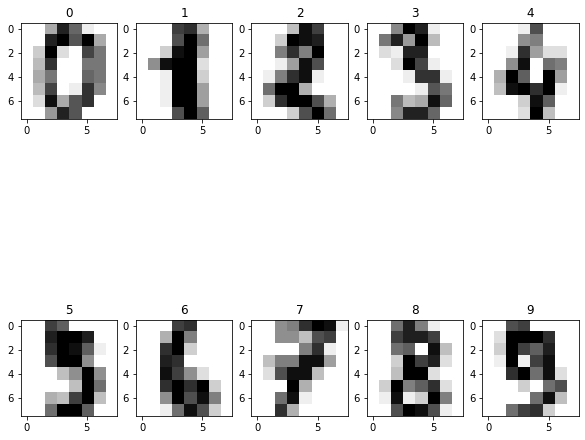

In [96]:
from sklearn import datasets

# (note: we overwrite the previous data here, make sure to reload it if you go back to part 1)
Xall, tall = datasets.load_digits(return_X_y=True)

print(Xall.shape)
print(np.unique(tall))

# print some examples of data from the dataset
for j in range(10):
    plt.subplot(2,5,j+1)
    plt.imshow(np.reshape(Xall[j,:], (8,8)), cmap=plt.cm.gray_r)
    plt.title("%d" % tall[j])
plt.show()

As you can see there are 1797 images arranged as 64-dimensional vectors, and defining 10 classes.

In this case, the observed variables have many more dimensions, but we can use <i>multidimensional scaling</i> (MDS) to visualise the distribution of the classes somehow (note that MDS on a large dataset can take a while).  

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



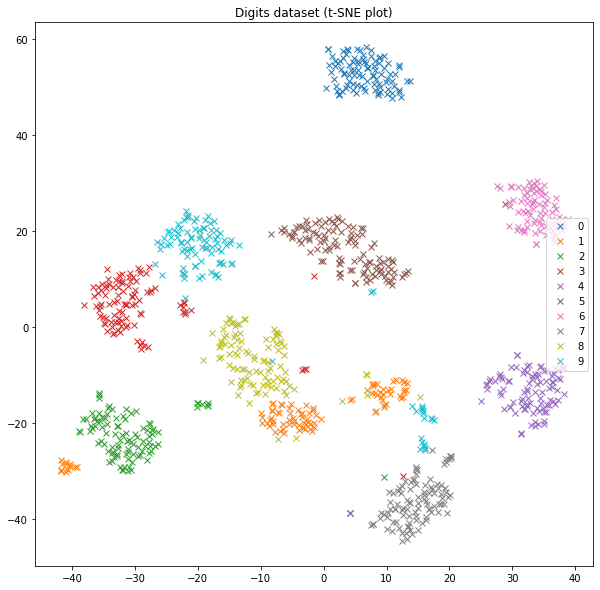

In [97]:
from sklearn.manifold import TSNE

# we select a subset of samples for speed
Ntrain=1000
J = np.random.permutation(Xall.shape[0])[:Ntrain]
X = Xall[J,:]
t = tall[J]   # Features

# we then optimise the multidimensional scaling
tsne = TSNE()
Xe = tsne.fit_transform(X)

# we then draw the classes on a 2D plot
for i in range(10):
    plt.plot(Xe[t==i,0], Xe[t==i,1], 'x', label='{}'.format(i))
plt.legend(loc='right')
plt.title('Digits dataset (t-SNE plot)')
plt.show()

This means that you have problem of <b>multiclass</b> classification. Some algorithms such as k-NN or MLPs can handle multiclass, whereas some other such as SVM need some additional work.

## 2.1. Classification with k-nearest neighbours (8 marks)
As a first step, we will try to perform the classification using k-Nearest Neighbours.
We will use the k-nearest neighbour classifier from `scikit learn`, which is  quite an extensive implementation of various machine learning algorithms.

In [118]:
from sklearn import neighbors

The first step will be to separate and put aside a test set for final evaluation.
To begin with, we show an example with a specific subset of half the data as the training set, and the other half as the test set.

In [119]:
#Example with k-NN:

I = range(len(tall))    # you could change this for np.random.permutation(len(tall)) to get a random selection
                        # do not do this for this workshop as I want to be able to compare final performance.

Itrain = I[:len(tall)//2]   # First half of indices for training
Itest = I[len(tall)//2:]    # Second half for test

Xtr = Xall[Itrain,:] # we define variables for the training set...
ttr = tall[Itrain]

Xte = Xall[Itest,:]  # ... and for the test set
tte = tall[Itest]

k = 5   # Choose the number of nearest neighbours

knn = neighbors.KNeighborsClassifier(n_neighbors=k)
knn.fit(Xtr, ttr)

# we can get the performance on the training set
Str = knn.score(Xtr, ttr)

# we can also calculate the performance on the test set:
Ste = knn.score(Xte, tte)

print('Performance with k=%i,\n\t- on training set %f \n\t- on test set %f' % (k, Str, Ste))

Performance with k=5,
	- on training set 0.988864 
	- on test set 0.955506


In a multiclass setting it is often worth calculating another error measure: the confusion matrix. This matrix tells you where your error comes from and whether two classes are specially confused.  

Confusion Matrix:-
[[88  0  0  0  0  0  0  0  0  0]
 [ 0 89  0  0  0  0  0  0  1  1]
 [ 1  0 80  5  0  0  0  0  0  0]
 [ 0  0  1 82  0  2  0  3  2  1]
 [ 0  0  0  0 87  0  0  1  0  4]
 [ 0  0  0  0  0 89  1  0  0  1]
 [ 0  0  0  0  0  0 91  0  0  0]
 [ 0  0  0  0  0  0  0 89  0  0]
 [ 0  5  1  1  0  0  0  1 79  1]
 [ 0  0  0  4  0  2  0  0  1 85]]


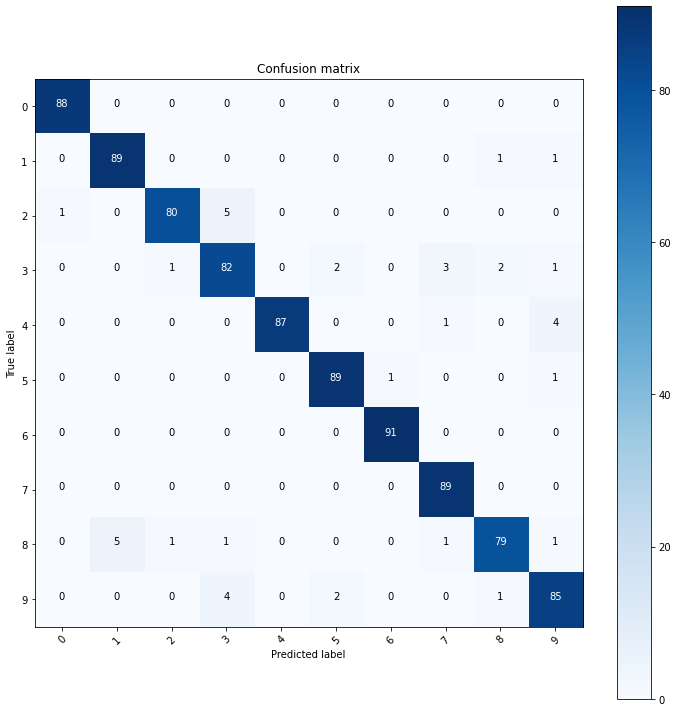

In [100]:
from sklearn import metrics
import itertools

from sklearn.metrics import confusion_matrix

# we predict the classes on the test data
pte = knn.predict(Xte)

# and we calculate the confusion matrix
cm = confusion_matrix(tte, pte)

np.set_printoptions(precision=2)


print("KNN Training Score:-")
tr_sck = knn.score(X_train, y_train)
print(tr_sck)
print("KNN Testing Score:-")
ts_sck = knn.score(X_test, y_test)
print(ts_sck)



# Plot_Confusion_Matrix
def plot_confusion_matrix(cm, classes):
    
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    print('Confusion Matrix:-')
    print(cm)

    thresh = cm.max() / 2
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

plot_confusion_matrix(cm, np.unique(tte))

### 2.1.1 K-fold cross validation (4 marks)
In the above example, we used half of the dataset as training set, and guessed the value of $k$ for the K-NN algorithm.

A better strategy is to estimate the optimum value of $k$, but dividing the training data into a training and a <b>validation</b> set; the generalisation error is then estimated on the validation set and the $k$ giving the minimum error is used for making predictions about unknown data.

Better than just dividing the training data into two is to use $K$ fold <b>cross validation</b> (don't confuse the $K$ in $K$ cross validation with the $k$ in $k$ nearest neighbours!)

**Task:** Use K-fold cross validation to find the best value of $k$ (you will need this value to complete tasks in Section 2.1.2).

`sklearn` can be used to produce training and validation sets automatically. More information at <http://scikit-learn.org/stable/modules/cross_validation.html>.  Don't worry about the deprecation warnings!

In [101]:
# Your code here
from sklearn.model_selection import cross_val_score
k_cross_val = 15
cross_val_list=[]
for i in range(1, k_cross_val):
    print("K Cross Validation for :- {}".format(i+1))
    #print each cv score (accuracy) and average them
    knn_cv = neighbors.KNeighborsClassifier(n_neighbors=i)
    cv_scores = cross_val_score(knn_cv, Xall, tall, cv=5)
    print(cv_scores)
    print("cv_scores mean:{}".format(np.mean(cv_scores)))
    cross_val_list.append(np.mean(cv_scores))
# Find the best value of k for KNN in this task
# Best neigbourhood is 3.
print(np.max(cross_val_list))

K Cross Validation for :- 2
[0.96 0.95 0.97 0.99 0.96]
cv_scores mean:0.9643933766635715
K Cross Validation for :- 3
[0.96 0.97 0.97 0.98 0.96]
cv_scores mean:0.9671711544413494
K Cross Validation for :- 4
[0.96 0.96 0.97 0.99 0.97]
cv_scores mean:0.966621788919839
K Cross Validation for :- 5
[0.95 0.96 0.97 0.98 0.97]
cv_scores mean:0.9638409161250386
K Cross Validation for :- 6
[0.95 0.96 0.97 0.98 0.96]
cv_scores mean:0.9627282575054161
K Cross Validation for :- 7
[0.94 0.96 0.97 0.97 0.95]
cv_scores mean:0.9593856391210152
K Cross Validation for :- 8
[0.94 0.96 0.97 0.98 0.95]
cv_scores mean:0.9599458372021046
K Cross Validation for :- 9
[0.94 0.96 0.97 0.98 0.95]
cv_scores mean:0.9582760755184154
K Cross Validation for :- 10
[0.93 0.95 0.97 0.98 0.95]
cv_scores mean:0.9566109563602601
K Cross Validation for :- 11
[0.93 0.95 0.97 0.98 0.95]
cv_scores mean:0.954942742185082
K Cross Validation for :- 12
[0.94 0.94 0.97 0.98 0.95]
cv_scores mean:0.9554982977406375
K Cross Validation f

### 2.1.2 Confusion matrix, misclassification analysis (4 marks)
**Task:**

Calculate the confusion matrix for the best parameter $k$ (use results from 2.1.1).

Show some examples of the misclassifications and try to explain the remaining errors.

Confusion Matrix:-
[[22  0  0  0  0  0  0  0  0  0]
 [ 0 13  0  0  0  0  0  0  0  1]
 [ 0  0 14  0  0  0  0  0  0  0]
 [ 0  0  0 18  0  0  0  0  0  0]
 [ 0  0  0  0 20  0  0  0  0  0]
 [ 0  0  0  0  0 16  0  0  0  0]
 [ 0  0  0  0  0  0 17  0  0  0]
 [ 0  0  0  0  0  0  0 22  0  0]
 [ 0  0  0  0  0  0  0  0 20  1]
 [ 0  0  0  0  0  1  0  0  0 15]]


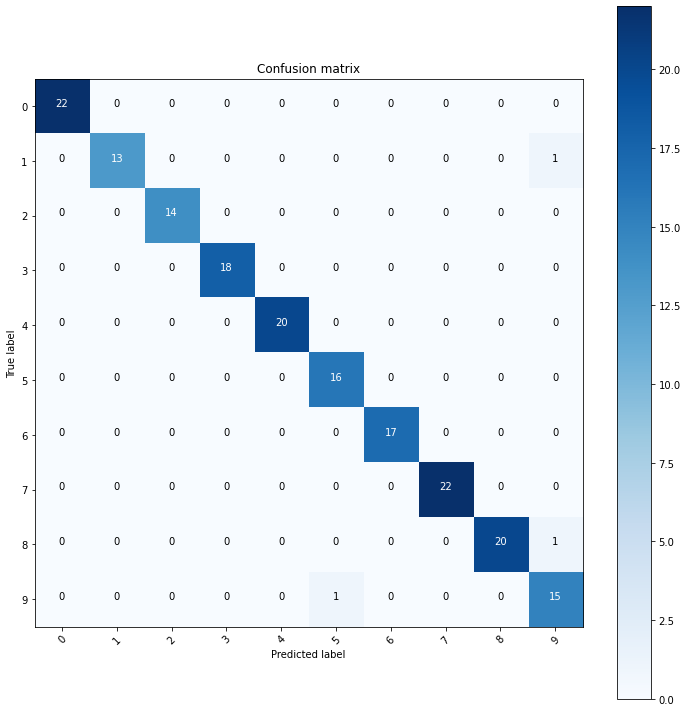

In [102]:
# Your code here
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(Xall,tall,test_size = 0.1,random_state=20)

knn_opt = neighbors.KNeighborsClassifier(n_neighbors=3)

knn_opt.fit(X_train, y_train)

y_pred = knn_opt.predict(X_test)

cm = confusion_matrix(y_pred, y_test)

plot_confusion_matrix(cm, np.unique(y_test))

## 2.2 Classification with MLP (8 marks)
Multi-layer perceptrons (MLP) are the sorts of neural networks that have been described in lectures.  In this section we'll use an MLP with weight decay regularisation (L2 regularisation) to classify the same data again.

Example MLP with 5 hidden units: `mlp = MLPClassifier(alpha=1e-5, hidden_layer_sizes=(5,))`

More information at <https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html>.

### 2.2.1 Parameters
**Task:** Use k-fold cross validation to train an MLP on this data, optimising regularisation parameter $\alpha$ and the number of hidden units, or even the number of layers.

In [103]:
# Your code here
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score

# Find a set of good parameters for \alpha, and the MLP size
mlp_classf = MLPClassifier(alpha=0.001, hidden_layer_sizes=(200,), activation='tanh', solver = 'adam', learning_rate_init = 0.0001, learning_rate='adaptive')

X_train, X_test, y_train, y_test = train_test_split(Xall,tall,test_size = 0.2,random_state=20)

mlp_classf.fit(X_train, y_train)
 
# Make predictions on the test data
y_pred = mlp_classf.predict(X_test)


k_cross_val = 15
cross_val_list=[]
for i in range(2, k_cross_val):
    print("K Cross Validation for :- {}".format(i+1))
    cv_scores = cross_val_score(mlp_classf, Xall, tall, cv=i)
    print(cv_scores)
    print("cv_scores mean:{}".format(np.mean(cv_scores)))
    cross_val_list.append(np.mean(cv_scores))
# Find the best value of MLP.
print(np.max(cross_val_list))
print(np.argmax(cross_val_list))

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



K Cross Validation for :- 3


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



[0.92 0.92]
cv_scores mean:0.9187553108997624
K Cross Validation for :- 4


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



[0.94 0.94 0.93]
cv_scores mean:0.9371174179187536
K Cross Validation for :- 5


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



[0.95 0.93 0.96 0.92]
cv_scores mean:0.9415627319970304
K Cross Validation for :- 6


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.94 0.92 0.94 0.97 0.91]
cv_scores mean:0.9371262766945219
K Cross Validation for :- 7


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.92 0.95 0.94 0.96 0.98 0.93]
cv_scores mean:0.9471497584541065
K Cross Validation for :- 8


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.92 0.95 0.89 0.95 0.96 0.94 0.91]
cv_scores mean:0.9332094219010562
K Cross Validation for :- 9


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.94 0.99 0.9  0.95 0.97 0.96 0.94 0.91]
cv_scores mean:0.9443377976190477
K Cross Validation for :- 10


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.95 0.98 0.97 0.93 0.95 0.96 0.95 0.9  0.93]
cv_scores mean:0.9487716359575656
K Cross Validation for :- 11


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.92 0.96 0.92 0.91 0.94 0.96 0.97 0.98 0.88 0.93]
cv_scores mean:0.9365518311607698
K Cross Validation for :- 12


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.9  0.99 0.93 0.93 0.95 0.96 0.98 0.96 0.98 0.91 0.94]
cv_scores mean:0.94771332961517
K Cross Validation for :- 13


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.93 0.99 0.99 0.95 0.96 0.95 0.95 0.97 0.97 1.   0.91 0.95]
cv_scores mean:0.9588068605518268
K Cross Validation for :- 14


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.91 0.98 0.99 0.93 0.95 0.94 0.98 0.97 0.98 0.96 0.97 0.91 0.95]
cv_scores mean:0.9549176712141991
K Cross Validation for :- 15


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/n

[0.89 0.96 0.99 0.97 0.91 0.93 0.93 0.95 0.96 0.99 0.98 0.94 0.88 0.94]
cv_scores mean:0.944905869324474
0.9588068605518268
10


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



### 2.2.2 Confusion matrix and misclassification analysis
**Task:** Calculate the confusion matrix for the best parameter, show some examples of the misclassifications and try to explain the remaining errors.

/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Training Score:-
0.9956709956709957
Testing Score:-
0.9777777777777777
Confusion Matrix:-
[[22  0  0  0  0  0  0  0  0  0]
 [ 0 13  0  0  0  0  0  0  0  0]
 [ 0  0 14  0  0  0  0  0  0  0]
 [ 0  0  0 18  0  0  0  0  0  0]
 [ 0  0  0  0 20  0  0  0  0  0]
 [ 0  0  0  0  0 16  0  0  0  1]
 [ 0  0  0  0  0  0 17  0  0  0]
 [ 0  0  0  0  0  0  0 22  0  0]
 [ 0  0  0  0  0  0  1  1 18  0]
 [ 0  0  0  0  0  0  0  0  1 16]]


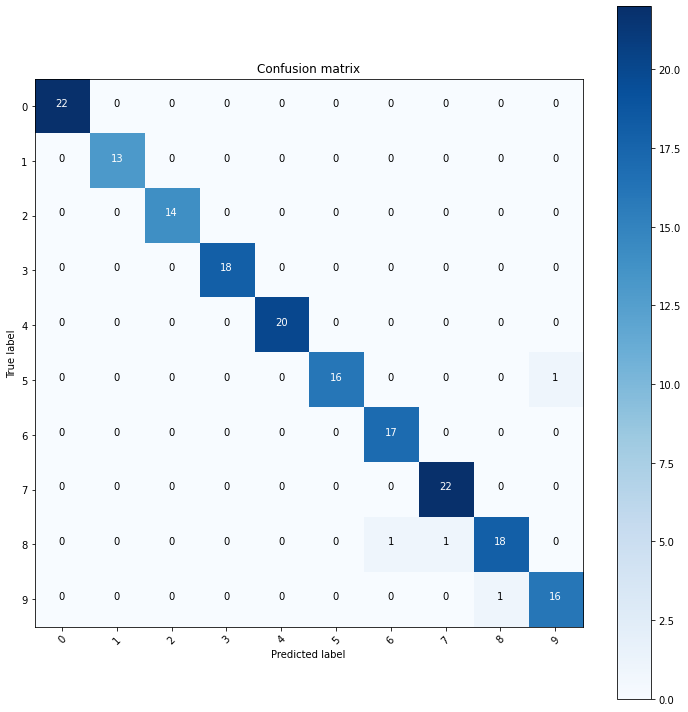

In [104]:
# Your code here
X_train, X_test, y_train, y_test = train_test_split(Xall,tall,test_size = 0.1,random_state=20)

mlp_classf.fit(X_train, y_train)

print("Training Score:-")
tr_sc = mlp_classf.score(X_train, y_train)
print(tr_sc)
print("Testing Score:-")
ts_sc = mlp_classf.score(X_test, y_test)
print(ts_sc)
y_pred = mlp_classf.predict(X_test)

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm, np.unique(y_test))

## 2.3 Classification with SVM (8 marks)
The next task is to use the SVM classifier for this data.

Support vector machines (SVMs) are popular and powerful classifiers. You can use SVMs with a "linear kernel" or with a RBF kernel. With a linear kernel the SVM can only separate the classes with a straight line or a (hyper)plane, but an RBF kernel is nonlinear and allows the SVM to generate curved decision boundaries.

Example can be found at: <https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html>

For SVM with <code>kernel='rbf'</code>, the SVM has two additional parameters $C > 0$ and $\gamma$.  $C$ is a regularisation constant that controls how strongly points that lie on the wrong side of the decision boundary are penalised.  When $C$ is large, they are heavily penalised which results in the boundary being flexible, but when it is small they are lightly penalised so the boundary tends to be straighter.  You can set the value of $C$ (and $\gamma$) with

        svm = SVC(kernel='rbf', C=1, gamma=0.1)

The default value of $C$ is 1 and the default value of $\gamma$ is 0.1.

More information at: <https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html#example-svm-plot-rbf-parameters-py>

In [105]:
# Example of SVM using RBF kernel
from sklearn.svm import SVC

X = np.array([[-1, -1], [-2, -1], [1, 1], [2, 1]])
y = np.array([1, 1, 2, 2])

svm = SVC(kernel='rbf', C=1, gamma=0.1, probability=True)            # SVM with a RBF kernel
svm.fit(X, y)

svm.predict([[-0.8, -1]])

array([1])

In standard, SVMs only allow for binary classification. The standard approach to use them on multiclass problem is to decompose the problem in N `1 vs all` classification problems: i.e., in this case, this would mean learning one SVM for classifying digit 0 against all other (eg, [1, 2, 3, 4, 5, 6, 7, 8, 9]), a second classifier for classifying digit 1 against all others, etc.
The final classification is given by the classifier that yields the strongest confidence.

This is not too hard to implement, but luckily sklearn implements `1 vs all` as standard in the SVC classes.

### 2.3.1 Parameters
**Task:** Train linear and non linear SVMs, using k-fold cross validation to find the best value for $C$ and $\gamma$.

**Note:** You can use the best performing SVM (among linear and non linear SVMs) with their best parameters $C$ and $\gamma$ for doing the following experiments.

In [106]:
%%time
# Your code here
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
from sklearn.svm import SVC

C_range = np.logspace(-2, 10, 13)
print("C_Range :-")
print(C_range)
gamma_range = np.logspace(-9, 3, 13)
print("Gamma Range:-")
print(gamma_range)
param_grid = dict(gamma=gamma_range, C=C_range)
cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
grid = GridSearchCV(SVC(), param_grid=param_grid, cv=cv)
grid.fit(Xall,tall)

print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))

C_Range :-
[1.e-02 1.e-01 1.e+00 1.e+01 1.e+02 1.e+03 1.e+04 1.e+05 1.e+06 1.e+07
 1.e+08 1.e+09 1.e+10]
Gamma Range:-
[1.e-09 1.e-08 1.e-07 1.e-06 1.e-05 1.e-04 1.e-03 1.e-02 1.e-01 1.e+00
 1.e+01 1.e+02 1.e+03]
The best parameters are {'C': 1.0, 'gamma': 0.001} with a score of 0.99
CPU times: user 2min 44s, sys: 982 µs, total: 2min 44s
Wall time: 2min 44s


### 2.3.2 Confusion matrix and misclassification analysis
**Task:** Calculate the confusion matrix for the best parameter, show some examples of the misclassifications and try to explain the remaining errors.

Training Score:-
0.9986082115518441
Testing Score:-
0.9888888888888889
Confusion Matrix:-
[[37  0  0  0  0  0  0  0  0  0]
 [ 0 31  0  0  0  0  0  0  0  0]
 [ 0  0 28  0  0  0  0  0  0  0]
 [ 0  0  0 38  0  0  0  0  0  0]
 [ 0  0  0  0 41  0  0  0  0  0]
 [ 0  0  0  0  0 32  0  0  0  1]
 [ 0  1  0  0  0  0 44  0  0  0]
 [ 0  0  0  0  0  0  0 40  0  0]
 [ 0  0  0  0  0  0  0  0 35  0]
 [ 0  0  0  0  0  1  0  0  1 30]]


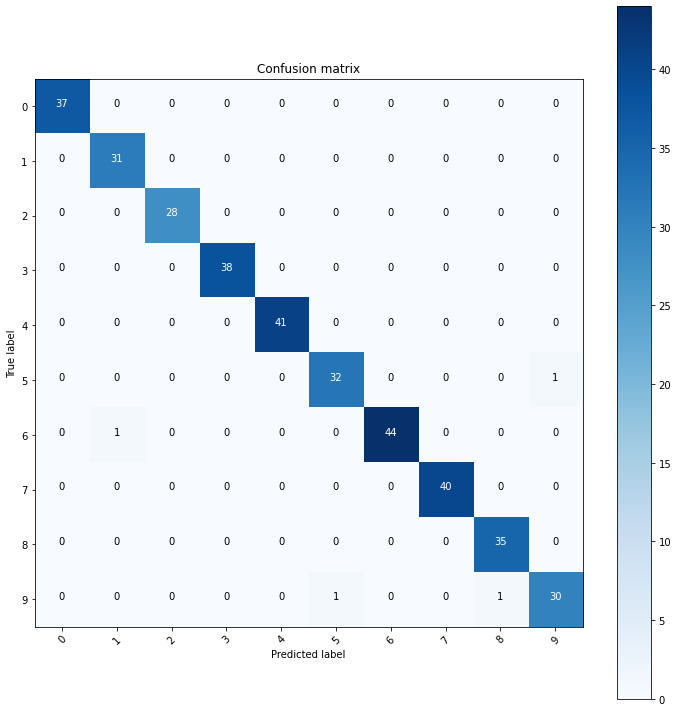

In [107]:
# Your code here
X_train, X_test, y_train, y_test = train_test_split(Xall,tall,test_size = 0.2,random_state=20)

# SVM with a RBF kernel
svm_best = SVC(kernel='rbf', C=1, gamma=0.001, probability=True)   
svm_best.fit(X_train, y_train)

# Best combination of the SVM model.
svm_best.fit(X_train, y_train)

print("Training Score:-")
tr_sc = svm_best.score(X_train, y_train)
print(tr_sc)
print("Testing Score:-")
ts_sc = svm_best.score(X_test, y_test)
print(ts_sc)
y_pred = svm_best.predict(X_test)

cm_svm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm_svm, np.unique(y_test))

## 2.4 Comparision (6 marks)
**Task:** Compare performance of all 3 algorithms for this problem. Discuss the differences in the remaining errors and what would be your suggestion going forward with this dataset.

**** Write in the report.****

# Part 3. Reconstruction using Autoencoder (15 marks)

In this part of the coursework, we implement an autoencoder for dimension reduction, without labels.

### Autoencoders

* An autoencoder is a neural network that is trained to attempt to copy its input to its output

* The network consists of two parts: an encoder and a decoder that produce a reconstruction

* The latent feature $z$ is a compression of the input (dimension reduction)

**Encoder** $z=f(x)$

**Decoder** $x=g(z)$

**Learning goal** $g(f(x)) = x$


In [120]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import accuracy_score

In [121]:
# Training set and test set
# We have 1797 samples in total, each with dimension=64
print(Xall.shape)

(1797, 64)


### 3.1 Define an Autoencoder (5 marks)

`[Input] - [Encoder(1)] - [Encoder(2)] - [Latent] - [Decoder(2)] - [Decoder(1)] - [Output]`

* Loss: Squared loss

$\frac{1}{M} \sum_{i=1}^M (x^\prime - x)^2$

Here $x^\prime$ is the output of the autoencoder.

More information at: <https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html>

In [122]:
# Shape of input and latent variable
# Please feel free to try other values for the size of the autoencoder

#n_input = 8*8

# Encoder structure
#n_encoder1 = 500
#n_encoder2 = 300

n_input = 64

# Encoder structure
n_encoder1 = 128
n_encoder2 = 64

# Decoder structure
n_decoder2 = 64
n_decoder1 = 128

# Define your latent space size
n_latent = 32

# Decoder structure
#n_decoder2 = 300
#n_decoder1 = 500

In [123]:
# Define the model
reg = MLPRegressor(hidden_layer_sizes = (n_encoder1, n_encoder2, n_latent, n_decoder2, n_decoder1), 
                   activation = 'tanh', 
                   alpha = 0.0001,
                   shuffle = True,
                   random_state = 58,
                   solver = 'adam', 
                   learning_rate_init = 0.0001,
                   learning_rate='adaptive',
                   max_iter = 60000, 
                   tol = 0.0000001, 
                   n_iter_no_change=40000,
                   verbose = False)

### 3.2 Training and testing (5 marks)

**Task:**

Plot the training curve wrt number of training iterations.

Calculate the average reconstruction error using the test set. Comparing with the training loss and analyze the result.

In [112]:
%%time
# Your code here
X_train, X_test, y_train, y_test = train_test_split(Xall,tall,test_size = 0.1,random_state=20)

CPU times: user 263 µs, sys: 675 µs, total: 938 µs
Wall time: 805 µs


In [113]:
%%time
reg.fit(X_train, X_train)

CPU times: user 3h 59min 43s, sys: 11h 26min 56s, total: 15h 26min 39s
Wall time: 19min 19s


/opt/omniai/software/Miniconda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning:

Training interrupted by user.



MLPRegressor(activation='tanh', hidden_layer_sizes=(128, 64, 32, 64, 128),
             learning_rate='adaptive', learning_rate_init=0.0001,
             max_iter=60000, n_iter_no_change=40000, random_state=58,
             tol=1e-07)

In [ ]:
# Training Curve
pd.DataFrame(reg.loss_curve_).plot(figsize=(10, 10))

In [114]:
X_test.shape

(180, 64)

In [ ]:
def calculate_reconstruction_loss(data, model):
    print(data.shape)
    reconstructions = model.predict(data)
    print(reconstructions.shape)
    reconstruction_errors = np.mean(np.abs(data - reconstructions), axis=0)
    print(reconstruction_errors.shape)
    return reconstruction_errors

In [ ]:
reconstruction_loss_normal = calculate_reconstruction_loss(X_test, reg)
print("Reconstruction Loss of Autoencoders.:-")
print(np.mean(reconstruction_loss_normal))

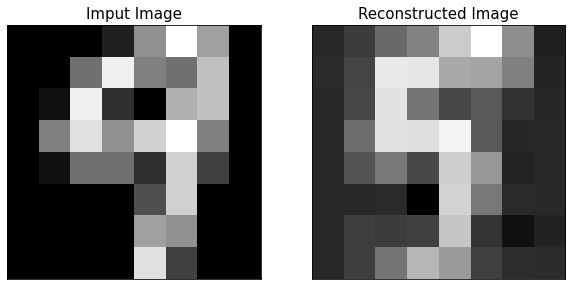

In [109]:
idx = np.random.randint(X_test.shape[0])
reconstructed_img = reg.predict(X_test[idx].reshape(-1,64))

plt.figure(figsize = (10,8))
plt.subplot(1,2,1)
plt.imshow(X_test[idx].reshape(8,8), 'gray')
plt.title('Imput Image', fontsize = 15)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(reconstructed_img.reshape(8,8), 'gray')
plt.title('Reconstructed Image', fontsize = 15)
plt.xticks([])
plt.yticks([])
plt.show()

### 3.3 Latent space visualisation (5 marks)

Now we have trained an autoencoder for the hand written digits reconstruction. The size of the latent space is defined in 2.1.

In the final task, we want to 'visualise' the latent space for the test set (you could also try the training set). Please see the following steps:

* Define a neural network with the same structure as the Encoder
* Copy from the previous step the trained parameters to the NEW encoder
* The output of the new encoder would be the latent space for the inputs
* Can you visualise the latent features? Can you color them using their labels?

Note that labels are not used in trained; Here we only use it for visualisation.

Note: For the "weights and biases" of the NN, you can use 'coefs_' and 'intercepts_'. These attributes of the NN can be changed manually by assigning a different matrix/list to them. Other deep learning libraries like PyTorch also have similar functions to get/assign model parameters.
<https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html>



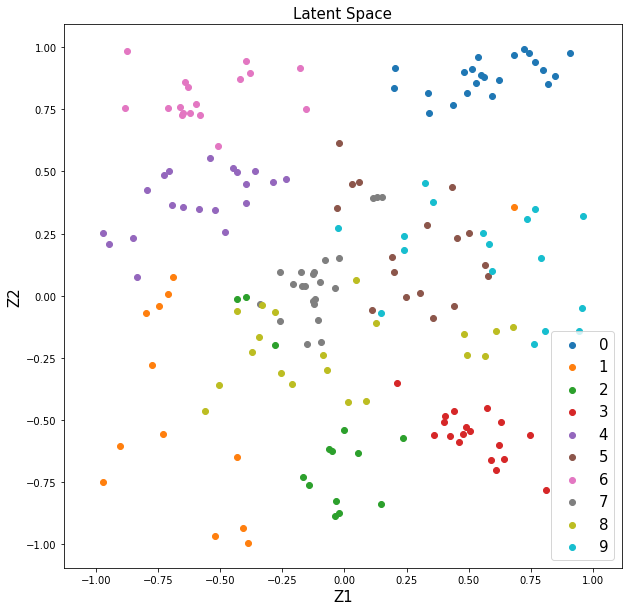

In [302]:
# Your code here
def encoder_latent(data):
    data = np.asmatrix(data)
    
    encoder1 = data*reg.coefs_[0] + reg.intercepts_[0]
    encoder1 = (np.exp(encoder1) - np.exp(-encoder1))/(np.exp(encoder1) + np.exp(-encoder1))
    
    encoder2 = encoder1*reg.coefs_[1] + reg.intercepts_[1]
    encoder2 = (np.exp(encoder2) - np.exp(-encoder2))/(np.exp(encoder2) + np.exp(-encoder2))
    
    latent = encoder2*reg.coefs_[2] + reg.intercepts_[2]
    latent = (np.exp(latent) - np.exp(-latent))/(np.exp(latent) + np.exp(-latent))
    
    return np.asarray(latent)

test_latent = encoder_latent(X_test)
#print(test_latent)
plt.figure(figsize = (10,10))
plt.scatter(test_latent[y_test == 0,0], test_latent[y_test == 0,1], label = '0')
plt.scatter(test_latent[y_test == 1,0], test_latent[y_test == 1,1], label = '1')
plt.scatter(test_latent[y_test == 2,0], test_latent[y_test == 2,1], label = '2')
plt.scatter(test_latent[y_test == 3,0], test_latent[y_test == 3,1], label = '3')
plt.scatter(test_latent[y_test == 4,0], test_latent[y_test == 4,1], label = '4')
plt.scatter(test_latent[y_test == 5,0], test_latent[y_test == 5,1], label = '5')
plt.scatter(test_latent[y_test == 6,0], test_latent[y_test == 6,1], label = '6')
plt.scatter(test_latent[y_test == 7,0], test_latent[y_test == 7,1], label = '7')
plt.scatter(test_latent[y_test == 8,0], test_latent[y_test == 8,1], label = '8')
plt.scatter(test_latent[y_test == 9,0], test_latent[y_test == 9,1], label = '9')
plt.title('Latent Space', fontsize=15)
plt.xlabel('Z1', fontsize=15)
plt.ylabel('Z2', fontsize=15)
plt.legend(fontsize = 15)
plt.axis('equal')
plt.show()

In [303]:
def decoder(new_data):
    new_data = np.asmatrix(new_data)
    decoder2 = new_data*reg.coefs_[3] + reg.intercepts_[3]
    decoder2 = (np.exp(decoder2) - np.exp(-decoder2))/(np.exp(decoder2) + np.exp(-decoder2))

    decoder1 = decoder2*reg.coefs_[4] + reg.intercepts_[4]
    decoder1 = (np.exp(decoder1) - np.exp(-decoder1))/(np.exp(decoder1) + np.exp(-decoder1))

    reconst = decoder1*reg.coefs_[5] + reg.intercepts_[5]
    reconst = (np.exp(reconst) - np.exp(-reconst))/(np.exp(reconst) + np.exp(-reconst))

    return np.asarray(reconst)

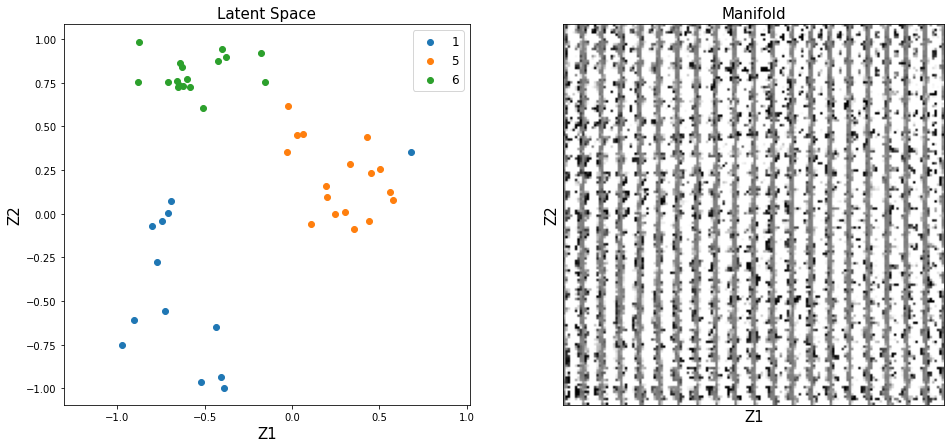

In [307]:
# Initialize canvas
nx = 20
ny = 20
x_values = np.linspace(-1, 1, nx)
y_values = np.linspace(-1, 1, ny)
canvas = np.empty((8*ny, 8*nx))

for i, yi in enumerate(y_values):
        for j, xi in enumerate(x_values):
            latent = np.array([[xi, yi]])
            reconst = decoder(latent)
            canvas[(nx-i-1)*8:(nx-i)*8,j*8:(j+1)*8] = reconst.reshape(8, 8)

plt.figure(figsize = (16, 7))
plt.subplot(1,2,1)
plt.scatter(test_latent[y_test == 1,0], test_latent[y_test == 1,1], label = '1')
plt.scatter(test_latent[y_test == 5,0], test_latent[y_test == 5,1], label = '5')
plt.scatter(test_latent[y_test == 6,0], test_latent[y_test == 6,1], label = '6')
plt.title('Latent Space', fontsize = 15)
plt.xlabel('Z1', fontsize = 15)
plt.ylabel('Z2', fontsize = 15)
plt.legend(fontsize = 12)
plt.axis('equal')
plt.subplot(1,2,2)
plt.imshow(canvas, 'gray')
plt.title('Manifold', fontsize = 15)
plt.xlabel('Z1', fontsize = 15)
plt.ylabel('Z2', fontsize = 15)
plt.xticks([])
plt.yticks([])
plt.show()

Please discuss your implementation and analyse results for this autoencoder in your report.

## Part 4. Maskedface Detection (30 marks)
Write a function `count_masks(dataset)` which will count the number of faces correctly wearing mask (`with_mask` class), without mask (`without_mask` class) and incorrectly wearing mask (`mask_weared_incorrect` class) in the list of images `dataset` which is an instantiation of the `MaskedFaceTestDataset` class shown below. (**Hint**: You are expected to implement a 3 class (4 class with background) masked face detector which can detect the aforementioned categories of objects in a given image. However, you are absolutely free to be more innovative and come out with different solutions for this problem.)

**Note:** If you need to upload a file larger than 100MB limit, please upload that file in an external storage and put that link in the report to be uploaded with your submission.

#### Inputs
* `dataset` is an object of the `MaskedFaceTestDataset` class shown in the cell below.

#### Outputs
* This function should return a 2 dimensional numpy array of shape $N \times 3$ of data type `int64` whose values should respectively indicate the number of faces wearing mask, without mask and incorrectly wearing mask. Here $N$ is the total number of images.

#### Data
* You can train and test your model on the data available at https://empslocal.ex.ac.uk/people/staff/ad735/ECMM426/MaskedFace.zip. This dataset contains some images and corresponding annotations (locations together with category information) of masked faces, which are split into `train` and `val` subsets. You can train your model on the `train` set and decide your hyperparameters on the `val` sets. **As MaskedFace dataset is quite large in size, please do not upload it with your submission**.

#### Trained models
* Please save the trained model (weights and biases) in the `.pth` format.
* Please provide the testing code, including loading the trained model and perform the counting.

#### Marking Criteria
* Saved model weights can be successfully loaded to your chosen/designed model. You will not get any mark if your model is missing or it cannot be loaded. **[9 marks]**.
* The evaluation will be done based on Mean Absolute Percentage Error (MAPE) which is defined as follows:
$$\text{MAPE} = \frac{1}{n}\sum_{t=1}^n \left|\frac{A_t - P_t}{\max(A_t, 1)}\right| \times 100 $$
where $A_t$ is the true number and $P_t$ is the predicted number of the corresponding class $t$ in an image. For each image in `dataset`, MAPE will be computed, which will be averaged over all the images in `dataset`. You will obtain 50% marks if the obtained average MAPE of your model on the test set is lower than or equal to 30%, 62.5% marks if your model obtains 25% MAPE or less, 75% marks if your model gets 20% MAPE or less, 87.5% marks if your model acquires 15% MAPE or less, and full marks if your model secures 10% MAPE or less. You will not obtain any mark if your model can not achieve minimum 30% MAPE **[15 marks]**.
* Please discuss your implementation and results in your report **[6 marks]**.

In [52]:
import os
import numpy as np
import torch
import torchvision
import pycocotools
import pandas as pd
from PIL import Image
from torch.utils.data import Subset, DataLoader
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.nn as nn
from torchvision.transforms import v2
import matplotlib.pyplot as plt
from collections import Counter
import xmltodict
import statistics

In [68]:
# Dataset
import os, glob
from PIL import Image
from torch.utils.data import Dataset
class MaskedFaceTestDataset(Dataset):
    def __init__(self, root, transform=None):
        super(MaskedFaceTestDataset, self).__init__()
        self.imgs = sorted(glob.glob(os.path.join(root, '*.png')))
        self.transform = transform

    def __getitem__(self, index):
        img_path = self.imgs[index]
        img = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        return img

    def __len__(self):
        return len(self.imgs)

In [69]:
def get_transform(train):
    #Transform of the images.
    transform_list= []
    
    transform_list.append(v2.PILToTensor())
    transform_list.append(v2.ConvertImageDtype(torch.float))
    
    if train:
        transform_list.append(v2.RandomHorizontalFlip(0.5))
    transform_object = v2.Compose(transform_list)
    
    return transform_object

In [70]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [71]:
def load_model_from_file(num_classes, filename, flag=True):   
    # Load an object detection model pretrained on MS COCO.
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=flag, weights_backbone=flag)
    # Load the fasterrcnn resnet50.
    chk = torch.load(filename)
    # Load state dictionary.
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new on
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    # return model.
    model.load_state_dict(chk)
    
    return model

In [90]:
num_classes = 4

# Download the model from this link (https://universityofexeteruk-my.sharepoint.com/:f:/r/personal/dj379_exeter_ac_uk/Documents/COMM417DA_Coursework_Machine_Learning_Model_Deepak_Jha?csf=1&web=1&e=RbVNAu)
# put the model file in the current directory.
model_filename = 'trained_model_faster_rcnn_epoch_245_loss_68_Final.pth'

loaded_model = load_model_from_file(num_classes, model_filename)

In [73]:
test_dataset = MaskedFaceTestDataset(root='MaskedFaceTest', transform=get_transform(train=False))
#test_dataset = MaskedFaceTestDataset(root='MaskedFaceTest')
print(len(test_dataset))
# data loader
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=12, collate_fn=collate_fn)

6


In [74]:
model = loaded_model.cpu()
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [85]:
# Count masked faces
def count_masks(test_dataset):
    
    confidence_score = 0.7
    
    len_dataset = len(test_dataset)
    
    inference_results_matrix = np.zeros((len_dataset,3))

    for i in range(len(test_dataset)):
        img = test_dataset[i]
        
        with torch.no_grad():
            prediction = model([img])
    
        for element in range(len(prediction[0]['boxes'])):
            label = prediction[0]['labels'][element].cpu().item()
            score = np.round(prediction[0]['scores'][element].cpu().numpy(), decimals= 4)
            if score > confidence_score:
               inference_results_matrix[i][label-1] += 1 
            
    return inference_results_matrix

In [92]:
class_str2num = {'with_mask': 1,'without_mask': 2,'mask_weared_incorrect': 3}
class_num2str = {v: k for k, v in class_str2num.items()}

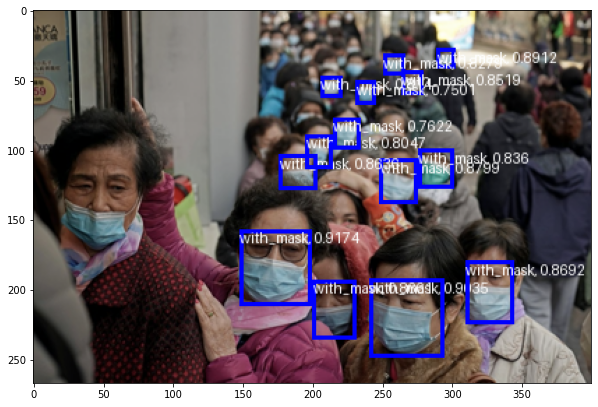

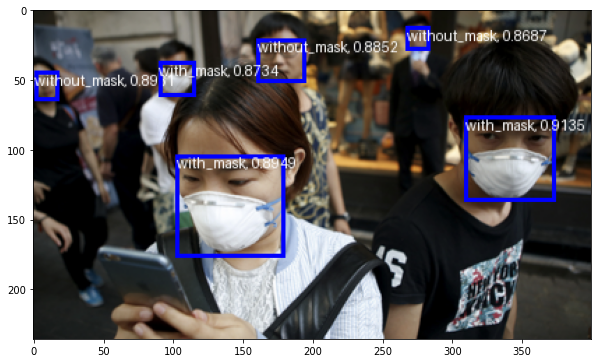

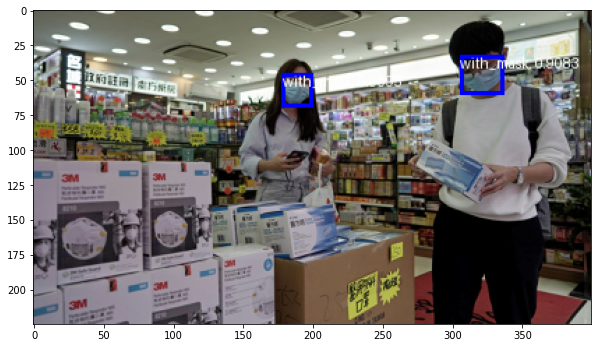

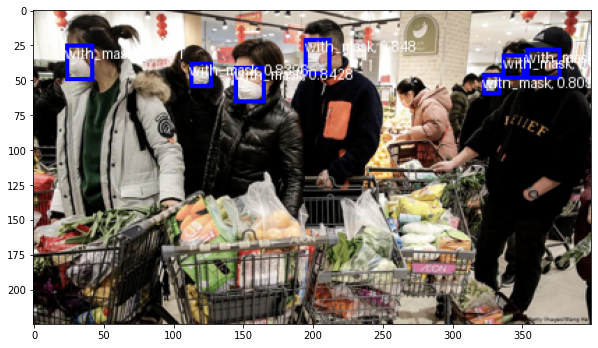

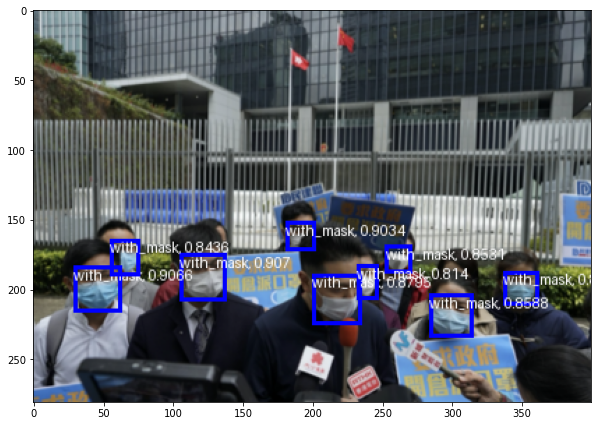

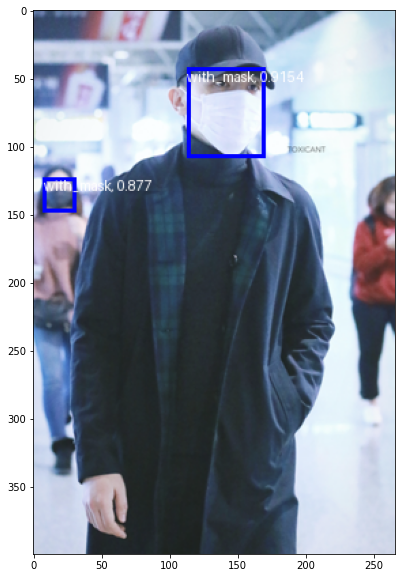

In [93]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams['figure.dpi'] = 72

# Iterate the test dataset.
for i in range(len(test_dataset)):
    img = test_dataset[i]
    
    #put the model in evaluation mode
    with torch.no_grad():
        prediction = infer_model([img])    
    image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
    draw = ImageDraw.Draw(image)
    
    # Plot each prediction boxes.
    for element in range(len(prediction[0]['boxes'])):
        box = prediction[0]['boxes'][element].cpu().numpy()
        label = prediction[0]['labels'][element].cpu().item()
        score = np.round(prediction[0]['scores'][element].cpu().numpy(), decimals= 4)
        if score > 0.7:
            draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline ='blue', width =3)
            draw.text((box[0], box[1]), text = class_num2str[label] + ', ' + str(score))
    plt.imshow(image)
    plt.show()

In [86]:
%%time
inf_results1 = count_masks(test_dataset)
print(inf_results1.shape)
print(inf_results1)

(6, 3)
[[14.  0.  0.]
 [ 3.  3.  0.]
 [ 2.  0.  0.]
 [ 7.  0.  0.]
 [ 9.  0.  0.]
 [ 2.  0.  0.]]
CPU times: user 1min 14s, sys: 11.6 s, total: 1min 25s
Wall time: 4.69 s


In [ ]:
# This cell is reserved for the unit tests. Please leave this cell as it is.

## Report and Analysis

For this project, you must write a **project report** and submit it with this jupyter notebbook.

In the report you will describe your implementation and any decisions you made to implement your code in a particular way. Then you will show and discuss the results that you obtain. There is no limit in terms of words or pages. If it is necessary, you can use the questions as your headings and try to write the answers in the report. While writing the answers, you can (don't have to) refer to your code in the notebook or you can (don't have to) insert a screenshot of it within the report. You don't have to write literature review; Please insert references (if there're any).